# Exploratory Data Analysis - Pulsar Data

In this Jupyter Notebook, we will perform Exploratory Data Analysis (EDA) on our dataset. This EDA steps includes:

    - Understanding the structure and variables of the dataset.
    - Identifying features and observations that might need cleaning and preprocessing.
    - Summarizing key statistics and relationships.
    - Visualizing data distributions and patterns.

Through this process, we aim to extract preliminary insights that might be useful for feature engineering, identify trends, and generate hypotheses for more in-depth investigation.

In [1]:
# Import the necessary libraries
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import umap
from src.utils.transformers import Standardizer
from sklearn.decomposition import PCA
import sweetviz as sv

c:\Users\guibl\Proximus-Pulsar-Project\.venv\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\guibl\Proximus-Pulsar-Project\.venv\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\guibl\Proximus-Pulsar-Project\.venv\lib\site-packages\umap\dist

---
## 1. Importing the Data and Initial Exploration

This section contains:
- Importing of the data.

- Description of key statistics for each feature.

- Verification of missing values and duplicate observations.

- Computation of the dataset balance

In [2]:
# Create the dataframe from the .csv file
df = pd.read_csv('data/pulsar_data.csv')
print(df.shape)
df.head()

(17898, 9)


,mean_ip,std_ip,kurt_ip,skew_ip,mean_dm,std_dm,kurt_dm,skew_dm,target
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0


- It can be seen that all features of the dataset are numeric

### Data Key Statistics:

In [3]:
# Describe the features of the dataset
df.describe()

,mean_ip,std_ip,kurt_ip,skew_ip,mean_dm,std_dm,kurt_dm,skew_dm,target
count,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000,17898.000000
mean,111.079968,46.549532,0.477857,1.770279,12.614400,26.326515,8.303556,104.857709,0.091574
std,25.652935,6.843189,1.064040,6.167913,29.472897,19.470572,4.506092,106.514540,0.288432
min,5.812500,24.772042,-1.876011,-1.791886,0.213211,7.370432,-3.139270,-1.976976,0.000000
25%,100.929688,42.376018,0.027098,-0.188572,1.923077,14.437332,5.781506,34.960504,0.000000
50%,115.078125,46.947479,0.223240,0.198710,2.801839,18.461316,8.433515,83.064556,0.000000
75%,127.085938,51.023202,0.473325,0.927783,5.464256,28.428104,10.702959,139.309331,0.000000
max,192.617188,98.778911,8.069522,68.101622,223.392141,110.642211,34.539844,1191.000837,1.000000


- Comparing the IQR with the min-max values, there might be some outlier values on most of the features, which will be further verified on the data visualization section.

- It can be seen that the numeric features have different scales, so normalization or standardization will be needed if the chosen ML algorithm is sensitive to scaling.

- Moreover, there does not seem to be any missing data, comparing the count of observations and the shape of the dataframe, but that can be confirmed below.

### Missing Values and Duplicate Observations:

In [4]:
# Check for missing values
df.isnull().sum()

mean_ip    0
std_ip     0
kurt_ip    0
skew_ip    0
mean_dm    0
std_dm     0
kurt_dm    0
skew_dm    0
target     0
dtype: int64

In [5]:
# Check for duplicate rows
df.duplicated().sum()

0

- As seen above, there is no missing values or duplicated observations, so these won't be problems when preprocessing the data for the ML model.

### Dataset Balance:

In [6]:
# Check the balancedness of the target variable
round((df.target.value_counts()/df.shape[0])*100, 2)

target
0    90.84
1     9.16
Name: count, dtype: float64

- The dataset contains only 9.16% of positives, which is a significant imbalance.

- This can influence the prediction capabilities of certain models for the positive class.

- It is adviceable to deal with imbalance some way, either by resampling techniques (data biasing), using other metrics for evaluation (e.g. testing different threshold values) or tweaking the model to adjust its cost or loss according to the observation's class (e.g. adding weights in a random forest).

---
## 2. Data Visualization

### BoxPlots:

- The boxplots are very useful to visualize the presence of outliers in the features, in order to determine wheater it is a problem to be dealt with in preprocessing.

In [7]:
# Plots two figures, one with the boxplots of all features and another with all features separated by the target variable
rows, cols = (2,4)
fig_box = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns, horizontal_spacing=0.05, vertical_spacing=0.2)

for i, col in enumerate(df.columns[:-1]):
    trace = go.Box(y=df[col], name=col)
    row_num = (i//(cols)) + 1
    col_num = (i%cols) + 1
    fig_box.append_trace(trace, row=row_num, col=col_num)

fig_box.update_layout(
    height=300,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    showlegend=False
    )
fig_box.show()

# Create a figure with 3x4 subplots with the box plots of all features separated by the target variable
fig_box_target = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns, horizontal_spacing=0.05, vertical_spacing=0.2)

df_0 = df[df['target'] == 0]
df_1 = df[df['target'] == 1]

for i, col in enumerate(df.columns[:-1]):
    trace_0 = go.Box(y=df_0[col], name='target_0', marker_color = 'indianred')
    trace_1 = go.Box(y=df_1[col], name='target_1', marker_color = 'lightseagreen')
    row_num = (i//(cols)) + 1
    col_num = (i%cols) + 1
    fig_box_target.append_trace(trace_0, row=row_num, col=col_num)
    fig_box_target.append_trace(trace_1, row=row_num, col=col_num)

fig_box_target.update_layout(
    height=300,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    showlegend=False
    )
fig_box_target.show()

- It can be seen that in many features there is a visible separation between the majority of observations belonging to the different targets.

- Without class separation, we see many outliers in each feature, which is due to the inbalance in the dataset. This is because the outliers are mainly concentrated in the negatives, which are the predominant class.

### Histograms:

- These plots are useful to observe the features' distributions. They can indicate that some transformation might be useful to normalize that feature, which can be benefitial to some models.

- They are represented below as probability distributions, in order to better visualize the difference in distributions for each class. 

In [8]:
# Plots two figures, one with the histograms of all features and another with all features separated by the target variable
rows, cols = (2,4)
fig_hist = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns, horizontal_spacing=0.05, vertical_spacing=0.2)

for i, col in enumerate(df.columns[:-1]):
    trace = go.Histogram(x=df[col], name=col, histnorm='probability density')
    row_num = (i//(cols)) + 1
    col_num = (i%cols) + 1
    fig_hist.append_trace(trace, row=row_num, col=col_num)

fig_hist.update_layout(
    height=300,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    showlegend=False
    )
fig_hist.show()

# Create a figure with 3x4 subplots with the box plots of all features separated by the target variable
fig_hist_target = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns, horizontal_spacing=0.05, vertical_spacing=0.2)

df_0 = df[df['target'] == 0]
df_1 = df[df['target'] == 1]

for i, col in enumerate(df.columns[:-1]):
    if i == len(df.columns[:-1]) - 1:
        trace_0 = go.Histogram(x=df_0[col], name='target_0', marker_color = 'indianred', histnorm='probability density')
        trace_1 = go.Histogram(x=df_1[col], name='target_1', marker_color = 'lightseagreen', histnorm='probability density')
    else:
        trace_0 = go.Histogram(x=df_0[col], name='target_0', marker_color = 'indianred', histnorm='probability density', showlegend=False)
        trace_1 = go.Histogram(x=df_1[col], name='target_1', marker_color = 'lightseagreen', histnorm='probability density', showlegend=False)

    row_num = (i//(cols)) + 1
    col_num = (i%cols) + 1
    
    fig_hist_target.add_trace(trace_0, row=row_num, col=col_num)
    fig_hist_target.add_trace(trace_1, row=row_num, col=col_num)

fig_hist_target.update_layout(
    height=300,
    width=900,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    barmode='overlay'
    )
fig_hist_target.update_traces(opacity=0.75)
fig_hist_target.show()

- Again the separation between the negatives and positives is clear in several features.

- Some features show a rather normal distribution (e.g. *mean_ip*), while others show apparent right skewdness (e.g. *std_dm*)

### Correlation Map:

- Can be useful to analyse the relationship between variables.

- Able to indicate linear correlations between the target variable and the features, which might suggest that the target can be more easily predicted. 

In [9]:
# Plots the Correlation Heatmap
fig_corr = go.Figure(
    go.Heatmap(
        z=df.corr().values,
        text=df.corr().values.round(2).astype(str),
        texttemplate="%{text}",
        textfont={"size":12},
        x=df.columns,
        y=df.columns,
        colorscale=px.colors.diverging.RdBu,
        zmin=-1,
        zmax=1
    )
)

fig_corr.update_layout(
    height=800,
    width=800,
    title='Correlation Heatmap'
)

fig_corr.show()

- All the *..._ip* features have a significant correlation between themselves, the same is valid for the *..._dm* features (as seen by the two darker larger squares in the map). This makes sense, as they are metrics from the same distribution (*ip* or *dm*).

- Strong positive correlation between *kurt_ip* and the *target*.

- In the *ip* features, both mean and std have a negative correlation with target, while kurt and skew have positive correlation. The opposite is seen in the *dm* features.

### UMAP

- Uniform Manifold Approximation and Projection (UMAP) is a dimension reduction technique that can be used for visualisation similarly to t-SNE, but also for general non-linear dimension reduction.

In [10]:
embedding = umap.UMAP(n_neighbors=5).fit_transform(df.drop('target', axis=1))

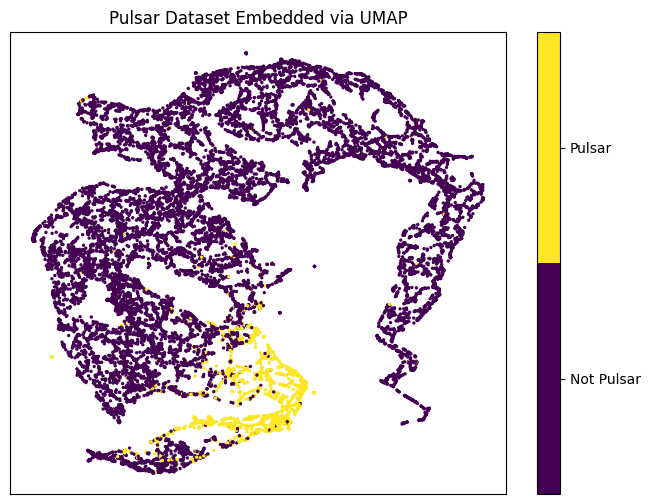

In [11]:
# Plot the UMAP embeddings
fig, ax = plt.subplots(1, figsize=(8, 6))
plt.scatter(*embedding.T, s=2, c=df.target, alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(3)-0.5)
cbar.set_ticks(np.arange(2))
cbar.set_ticklabels(['Not Pulsar', 'Pulsar'])
plt.title('Pulsar Dataset Embedded via UMAP');

 - It is possible to see a good separation between the two classes. This separation suggests that there are intrinsic features or combinations of features in the data that differentiate one class from another. In other words, the fact that UMAP successfully separates classes implies the presence of meaningful patterns or discriminative features in the data that distinguish the classes, indicating that a well-trained predictive model has a good potetial to obtain a strong predictive power.

- This embeddings can be used directly for clustering or as features for a predictive model, but UMAP requires hyperparameter tuning, so the inclusion of this model in the data preprocessing pipeline introduces one more hyperparameter to be tuned, increasing tuning time. Another dimensionality reduction technique that does not have this problem is PCA, but since the number of numeric features is not so high, it is not necessary to include any dimensionality reduction as a step in the data preprocessing. Nontheless, they can be interesting tools for visualization and understanding of the data.   

### PCA Analysis ip Features

In [16]:
# Initial PCA analysis for all components of the ip features
pca_ip = PCA()

# Standardize the features
X = Standardizer().fit_transform(df.drop('target', axis=1))
X['target'] = df['target']

In [17]:
# Apply PCA to the ip features
pca_ip.fit(X[X.columns[:4]])

# Prints the explained variance ratio for each component
print(pca_ip.explained_variance_ratio_)
print("First two components explain "+ str(100*round(pca_ip.explained_variance_ratio_[:2].sum(), 4))+"% of the variance")

[0.77881086 0.14936511 0.06656629 0.00525773]
First two components explain 92.82000000000001% of the variance


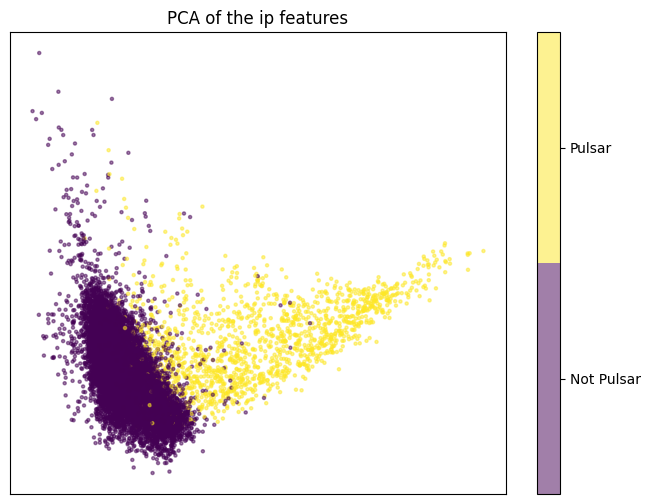

In [18]:
# Obtain the first two components of the ip PCA analysis
ip_comps = pca_ip.transform(X[X.columns[:4]])[:,:2]

# Plot the first two components of the ip PCA analysis
fig, ax = plt.subplots(1, figsize=(8, 6))
plt.scatter(*ip_comps.T, s=5, c=df.target, alpha=0.5, cmap='viridis')
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(3)-0.5)
cbar.set_ticks(np.arange(2))
cbar.set_ticklabels(['Not Pulsar', 'Pulsar'])
plt.title('PCA of the ip features');


- It is possible to see some accumulation of pulsar observations on the right of the plot, showing that these two features might be useful when predicting the target

In [19]:
# Plots the distribution of the first two components of the ip PCA analysis
rows, cols = (1,2)
X[['ip_comp1', 'ip_comp2']] = ip_comps

# Creates boxplots for the ip variables separated by the outlier flag
fig_hist_ip_pca = make_subplots(rows=rows, cols=cols, subplot_titles=X.columns[-2:], horizontal_spacing=0.05, vertical_spacing=0.2)

df_tgt_pca_ip_0 = X[X['target'] == 0]
df_tgt_pca_ip_1 = X[X['target'] == 1]

for i, col in enumerate(X.columns[-2:]):
    if i == len(X.columns[-2:]) - 1:
        trace_pca_ip_0 = go.Histogram(x=df_tgt_pca_ip_0[col], name='Not Pulsar', marker_color = 'navy', histnorm='probability density')
        trace_pca_ip_1 = go.Histogram(x=df_tgt_pca_ip_1[col], name='Pulsar', marker_color = 'gold', histnorm='probability density')
    else:
        trace_pca_ip_0 = go.Histogram(x=df_tgt_pca_ip_0[col], name='Not Pulsar', marker_color = 'navy', histnorm='probability density', showlegend=False)
        trace_pca_ip_1 = go.Histogram(x=df_tgt_pca_ip_1[col], name='Pulsar', marker_color = 'gold', histnorm='probability density', showlegend=False)

    row_num = 1
    col_num = (i%cols) + 1
    
    fig_hist_ip_pca.add_trace(trace_pca_ip_0, row=row_num, col=col_num)
    fig_hist_ip_pca.add_trace(trace_pca_ip_1, row=row_num, col=col_num)


fig_hist_ip_pca.update_layout(
    height=400,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    barmode='overlay'
    )
fig_hist_ip_pca.update_traces(opacity=0.6)
fig_hist_ip_pca.show()

- The first component of the PCA in the ip features show a more clear distinction between pulsar and non pulsar observations, with very little overlap, while the second component shows much more overlap between distributions of the two classes.

- The fact that most of the variance is included in the first component, and that it has a good separation between the target classes, indicates that the ip features might be good predictors.

### 3.2 PCA Analysis dm Features

In [20]:
# Initial PCA analysis for all components of the ip features
pca_dm = PCA()

In [21]:
# Apply PCA to the ip features
pca_dm.fit(X[X.columns[4:8]])

# Prints the explained variance ratio for each component
print(pca_dm.explained_variance_ratio_)
print("First two components explain "+ str(100*round(pca_dm.explained_variance_ratio_[:2].sum(), 4))+"% of the variance")

[0.76435178 0.19140722 0.04020614 0.00403487]
First two components explain 95.58% of the variance


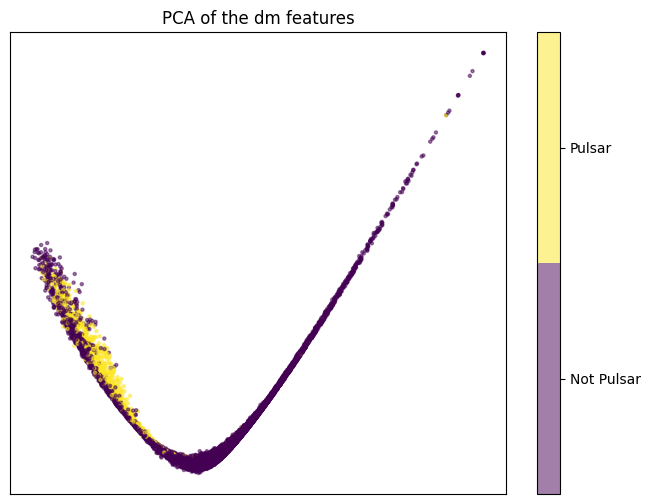

In [22]:
# Obtain the first two components of the dm PCA analysis
dm_comps = pca_dm.transform(X[X.columns[4:8]])[:,:2]

# Plot the first two components of the ip PCA analysis
fig, ax = plt.subplots(1, figsize=(8, 6))
plt.scatter(*dm_comps.T, s=5, c=df.target, alpha=0.5, cmap='viridis')
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(3)-0.5)
cbar.set_ticks(np.arange(2))
cbar.set_ticklabels(['Not Pulsar', 'Pulsar'])
plt.title('PCA of the dm features');


- From the two components plot, it is hard to see a clear separation between the two classes, with the pulsars being more a little more concentrated in the top left.

In [27]:
# Plots the distribution of the first two components of the dm PCA analysis
rows, cols = (1,2)
X[['dm_comp1', 'dm_comp2']] = dm_comps

# Creates boxplots for the ip variables separated by the outlier flag
fig_hist_dm_pca = make_subplots(rows=rows, cols=cols, subplot_titles=X.columns[-2:], horizontal_spacing=0.05, vertical_spacing=0.2)

df_tgt_pca_dm_0 = X[X['target'] == 0]
df_tgt_pca_dm_1 = X[X['target'] == 1]

for i, col in enumerate(X.columns[-2:]):
    if i == len(X.columns[-2:]) - 1:
        trace_pca_dm_0 = go.Histogram(x=df_tgt_pca_dm_0[col], name='Not Pulsar', marker_color = 'navy', histnorm='probability density')
        trace_pca_dm_1 = go.Histogram(x=df_tgt_pca_dm_1[col], name='Pulsar', marker_color = 'gold', histnorm='probability density')
    else:
        trace_pca_dm_0 = go.Histogram(x=df_tgt_pca_dm_0[col], name='Not Pulsar', marker_color = 'navy', histnorm='probability density', showlegend=False)
        trace_pca_dm_1 = go.Histogram(x=df_tgt_pca_dm_1[col], name='Pulsar', marker_color = 'gold', histnorm='probability density', showlegend=False)

    row_num = 1
    col_num = (i%cols) + 1
    
    fig_hist_dm_pca.add_trace(trace_pca_dm_0, row=row_num, col=col_num)
    fig_hist_dm_pca.add_trace(trace_pca_dm_1, row=row_num, col=col_num)


fig_hist_dm_pca.update_layout(
    height=400,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    barmode='overlay'
    )
fig_hist_dm_pca.update_traces(opacity=0.6)
fig_hist_dm_pca.show()

- The distribution plots show a more clear separation, specially in the first component, but still not as good as the first component of the ip features. This shows that the dm features might be less valuable for predicting the target class compared to .

---

## 3. Summarizing - EDA Report with Sweetviz

- With Sweetviz, an EDA report can be automatically generated, covering most of the details that were explored in this jupyter notebook.

In [28]:
report = sv.analyze([df, "Pulsar Dataset"], target_feat='target')
report.show_html('eda_pulsar_sv_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report eda_pulsar_sv_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
